In [87]:
import imp
import uproot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import pandas as pd
import os
import ROOT
import time
import math
helper = imp.load_source('helpfunction','/home/tmettler/Desktop/uBoone/do_plots/helpfunction.py')
#import /home/tmettler/Desktop/uBoone/do_plots/helpfunction as helper
from __future__ import division

import collections
NuCC = imp.load_source('NuCC_function','/home/tmettler/Desktop/uBoone/do_plots/NuCC_function.py')

%jsroot off

Warning in <TCanvas::Constructor>: Deleting canvas with same name: c1


In [88]:
# initialte ROOT default canvas
ROOT.gStyle.SetOptStat(0)
c1 = ROOT.TCanvas("c1","c1",1100,260)
c1.SetGrid(1)
c1.SetLeftMargin(0.14)
c1.SetRightMargin(0.18)
c1.SetBottomMargin(0.14)

ROOT.gStyle.SetOptStat(0)
c2 = ROOT.TCanvas("c2","c2",1100,520)
c2.SetGrid(1)
c2.SetLeftMargin(0.14)
c2.SetRightMargin(0.18)
c2.SetBottomMargin(0.14)
c2.Divide(2,1,0,0)

Warning in <TCanvas::Constructor>: Deleting canvas with same name: c1
Warning in <TCanvas::Constructor>: Deleting canvas with same name: c2


In [2]:
%%javascript
if(!requiresjs){
    var s = document.createElement('script');
    s.src='https://cdnjs.cloudflare.com/ajax/libs/require.js/2.3.6/require.min.js';
    document.body.appendChild(s)
}


<IPython.core.display.Javascript object>

# CRTinBNB tagger, Overlay or MC

In [90]:
# Load input files

inputdir = '/home/tmettler/Desktop/ub_data/mcc9.1/v08_00_00_17_V2/'
outputdir = inputdir+'NumuCC_tpc_cut/' 
outputdir_png, outputdir_root = NuCC.prepareOutput(outputdir)

#filename_overlay = 'NuCCana_Overlay_V18_V4.root'
filename_overlay = 'tmp/NuCCana_overlay_10k.root'
filename_data = 'NuCCana_Data_V16_V3.root'
filename_ext = 'tmp/NuCCana_ext_10k.root'
filename_dirt = 'NuCCana_Dirt_V20_V3.root'
    
tree_name = 'numuCCAna'

In [91]:
#Open all the trees of the four files (data, ext, dirt, overlay)

data, ext, dirt, overlay = NuCC.openTrees(inputdir, filename_data, filename_ext, filename_dirt, filename_overlay, tree_name)
NuCC.printNumberOfEntries(data,ext,dirt,overlay)

pot_overlay = NuCC.getPOT(inputdir,filename_overlay,tree_name)
pot_dirt =  NuCC.getPOT(inputdir,filename_dirt,tree_name)

pot_data =      9.036e+18 # tor860_wcut
data_trigger = 1942081.0 #4743794 # 1987072.0 # E1DCNT_wcut
ext_trigger =  25882118.0  #2120135 #5685315 # EXT
'''
pot_data =     1.25795274297e+18# tor860_wcut
data_trigger = 1359818.0*0.4 # E1DCNT
ext_trigger =  1359818.0  #2120135 #5685315 # EXT
pot_overlay = 1.25795274297e+18/0.5
pot_dirt = 1.25795274297e18/0.04
'''
print 'POT: '
print 'Data:\t\t', pot_data
print 'Ext:\t\t', 0
print 'Overlay:\t', pot_overlay
print 'Dirt:\t\t', pot_dirt
print ''
sample = [data,ext,overlay,dirt]
scale = {data:1.0,ext:1.0,overlay:1.0,dirt:1.0}
name = {data:'data',ext:'ext',overlay:'overlay',dirt:'dirt'}

scale[data], scale[ext], scale[dirt], scale[overlay] = NuCC.calculateScale(data_trigger, ext_trigger, pot_data, pot_dirt, pot_overlay)

scale[dirt] = scale[dirt]*1.3
scale[overlay] = scale[overlay]*1.3
print 'Scalefactors: '
print 'Data:\t\t', scale[data]
print 'Ext:\t\t', scale[ext]
print 'Overlay:\t', scale[overlay]
print 'Dirt:\t\t', scale[dirt]


Overlay: Number of Entries:	10000
Data: Number of Entries:	34835
Ext: Number of Entries:		10000
Dirt: Number of Entries:	96465

POT: 
Data:		9.036e+18
Ext:		0
Overlay:	1.26717374163e+19
Dirt:		2.9866803255e+20

Scalefactors: 
Data:		1.0
Ext:		0.0750356288461
Overlay:	0.927007845418
Dirt:		0.0393306237018


In [92]:
if 1:
    filename_overlay = 'tmp/wire/NuCCana_overlay_V20_wWire3613.rootout2.root'
    #filename_overlay = 'NuCCana_overlay_points_1kev.rootout2.root'
    filename_data = 'NuCCana_Data_V16_V3.rootout.root'
    filename_ext = 'tmp/wire/NuCCana_ext_V20_wWire_1k.rootout2.root'
    filename_dirt = 'tmp/wire/NuCCana_dirt_V20_wWire_1k.rootout2.root'

    tree_name = 't_out'

    data_out, ext_out, dirt_out, overlay_out = NuCC.openTreesOut(inputdir, filename_data, filename_ext, filename_dirt, filename_overlay, tree_name)
    NuCC.printNumberOfEntries(data_out,ext_out,dirt_out,overlay_out)

    sample_out = [data_out,ext_out,overlay_out,dirt_out]
    scale_out = {data_out:1.0,ext_out:1.0,overlay_out:1.0,dirt_out:1.0}
    name_out = {data_out:'data',ext_out:'ext',overlay_out:'overlay',dirt_out:'dirt'}

    scale_out[data_out], scale_out[ext_out], scale_out[dirt_out], scale_out[overlay_out] = NuCC.calculateScale(data_trigger, ext_trigger, pot_data, pot_dirt, pot_overlay)
    scale_out[dirt_out] = scale_out[dirt_out]*1.3
    scale_out[overlay_out] = scale_out[overlay_out]*1.3

Overlay: Number of Entries:	3612
Data: Number of Entries:	34834
Ext: Number of Entries:		999
Dirt: Number of Entries:	999



In [93]:
# Define signals

fidVol = '(Nu_Vx_sce>(-1.55+10) && Nu_Vx_sce<(254.8-10)) && (Nu_Vy_sce>(-115.53+10) && Nu_Vy_sce<(117.47-10)) &&(Nu_Vz_sce>(-0.1+10) && Nu_Vz_sce<(1036.9-50))'
MCfidVol = '(MCNu_Vx>(-1.55+10) && MCNu_Vx<(254.8-10)) && (MCNu_Vy>(-115.53+10) && MCNu_Vy<(117.47-10)) &&(MCNu_Vz>(-0.1+10) && MCNu_Vz<(1036.9-50))'
numu_signal = 'fidVol && MCfidVol && MCNu_CCNC==0 && MCNu_PDG==14 && MCle_PDG==13 && MCle_purity>0.5' # numu CC signal definition
numu_true = 'MCfidVol && MCNu_CCNC==0 && MCNu_PDG==14' # numu CC signal definition
numu_nomu = 'fidVol && MCfidVol && MCNu_CCNC==0 && MCNu_PDG==14 && MCle_PDG!=13 && MCle_purity>0.5' # not an MC muon
numu_lowpur = 'fidVol && MCfidVol && MCNu_CCNC==0 && MCNu_PDG==14 && MCle_purity<0.5' #low purity
numu_nc = 'fidVol && MCfidVol && MCNu_CCNC==1' # nutral current
numu_ov = 'fidVol && !MCfidVol' # out of fiducial
numu_other = 'fidVol && MCfidVol && MCNu_CCNC==0 && MCNu_PDG!=14' # e.g anti nu or nue
#signal = 'MCfidVol && MCNu_CCNC==0 && MCNu_PDG==14'
for x in sample:
    x.SetAlias('muon','(muon_candidate_key==track_key)')
    
num_fidVol = {}
for x in sample:
    x.SetAlias('fidVol',fidVol)
    x.SetAlias('MCfidVol',MCfidVol)
    x.SetAlias('numu_signal',numu_signal)
    x.SetAlias('numu_true',numu_true)
    x.SetAlias('numu_nomu',numu_nomu)
    x.SetAlias('numu_lowpur',numu_lowpur)
    x.SetAlias('numu_nc',numu_nc)
    x.SetAlias('numu_ov',numu_ov)
    x.SetAlias('numu_other',numu_other)
    num_fidVol[x] = x.GetEntries('fidVol && muon')*scale[x]
    
tot_num_fidVol = num_fidVol[ext]+num_fidVol[dirt]+num_fidVol[overlay]
overlay_signals = {'numu_signal','numu_nomu','numu_lowpur','numu_nc','numu_ov','numu_other'}

In [94]:
for x in sample_out:
    x.SetAlias('muon','(muon_candidate_key==track_key)')
    
num_fidVol = {}
for x in sample_out:
    x.SetAlias('fidVol',fidVol)
    x.SetAlias('MCfidVol',MCfidVol)
    x.SetAlias('numu_signal',numu_signal)
    x.SetAlias('numu_true',numu_true)
    x.SetAlias('numu_nomu',numu_nomu)
    x.SetAlias('numu_lowpur',numu_lowpur)
    x.SetAlias('numu_nc',numu_nc)
    x.SetAlias('numu_ov',numu_ov)
    x.SetAlias('numu_other',numu_other)
    #num_fidVol[x] = x.GetEntries('fidVol && muon')*scale[x]
    
#tot_num_fidVol = num_fidVol[ext]+num_fidVol[dirt]+num_fidVol[overlay]
#overlay_signals = {'numu_signal','numu_nomu','numu_lowpur','numu_nc','numu_ov','numu_other'}

In [95]:
# Load the global variables for access of functions

NuCC.loadGlobal(data,ext,dirt,overlay,data_out,ext_out,dirt_out,overlay_out,scale,scale_out,tot_num_fidVol,overlay_signals,sample,sample_out, name,name_out, outputdir_png, outputdir_root)
#NuCC.printGlobal()

Warning in <TCanvas::Constructor>: Deleting canvas with same name: c1


In [96]:
# initialte ROOT default canvas
ROOT.gStyle.SetOptStat(0)
c1 = ROOT.TCanvas("c1","c1",1100,260)
c1.SetGrid(1)
c1.SetLeftMargin(0.14)
c1.SetRightMargin(0.18)
c1.SetBottomMargin(0.14)

ROOT.gStyle.SetOptStat(0)
c2 = ROOT.TCanvas("c2","c2",1100,280)
c2.SetGrid(1)
c2.SetLeftMargin(0.14)
c2.SetRightMargin(0.18)
c2.SetBottomMargin(0.14)


Warning in <TCanvas::Constructor>: Deleting canvas with same name: c2


In [97]:
track_start_border_x = '(TrackStart_x_sce <(-1.55+10) || TrackStart_x_sce > (254.8-10))'
track_end_border_x = '(TrackEnd_x_sce <(-1.55+10) || TrackEnd_x_sce > (254.8-10))'
track_start_border_y = '(TrackStart_y_sce <(-115.53+10) || TrackStart_y_sce > (117.47-10))'
track_end_border_y = '(TrackEnd_y_sce <(-115.53+10) || TrackEnd_y_sce > (117.47-10))'
track_start_border_z = '(TrackStart_z_sce <(0.1+10) || TrackStart_z_sce > (1036.9-10))'
track_end_border_z = '(TrackEnd_z_sce <(0.1+10) || TrackEnd_z_sce > (1039.9-10))'

track_end_uncontained = '(' + track_end_border_x + ' || ' + track_end_border_y + ' || ' + track_end_border_z+ ')'


data.SetAlias("track_end_uncontained",track_end_uncontained)
ext.SetAlias("track_end_uncontained",track_end_uncontained)
overlay.SetAlias("track_end_uncontained",track_end_uncontained)
dirt.SetAlias("track_end_uncontained",track_end_uncontained)
data_out.SetAlias("track_end_uncontained",track_end_uncontained)
ext_out.SetAlias("track_end_uncontained",track_end_uncontained)
overlay_out.SetAlias("track_end_uncontained",track_end_uncontained)
dirt_out.SetAlias("track_end_uncontained",track_end_uncontained)

data.SetAlias("crt_cut","(abs(crtt0_time-(69000-crt_trig_corr_med)/1000-4)<0.8 || crtt0_time==-1)")
ext.SetAlias("crt_cut","(abs(crtt0_time-(69000-crt_trig_corr_med)/1000-3.57+3.195-4)<0.8 || crtt0_time==-1)")
overlay.SetAlias("crt_cut","(abs(crtt0_time-4)<0.8 || crtt0_time==-1)")
dirt.SetAlias("crt_cut","(abs(crtt0_time-4)<0.8 || crtt0_time==-1)")
data_out.SetAlias("crt_cut","(abs(crtt0_time-(69000-crt_trig_corr_med)/1000-4)<0.8 || crtt0_time==-1)")
ext_out.SetAlias("crt_cut","(abs(crtt0_time-(69000-crt_trig_corr_med)/1000-3.57+3.195-4)<0.8 || crtt0_time==-1)")
overlay_out.SetAlias("crt_cut","(abs(crtt0_time-4)<0.8 || crtt0_time==-1)")
dirt_out.SetAlias("crt_cut","(abs(crtt0_time-4)<0.8 || crtt0_time==-1)")


crt_tom_cut = ' nr_crthit_top==0 && crthit_vertex_zcut==0 && (track_uncontained==1 || nr_crthit_beam_tres==0) && crt_cut'
data.SetAlias("crt_tom_cut",crt_tom_cut)
ext.SetAlias("crt_tom_cut",crt_tom_cut)
overlay.SetAlias("crt_tom_cut",crt_tom_cut)
dirt.SetAlias("crt_tom_cut",crt_tom_cut)
data_out.SetAlias("crt_tom_cut",crt_tom_cut)
ext_out.SetAlias("crt_tom_cut",crt_tom_cut)
overlay_out.SetAlias("crt_tom_cut",crt_tom_cut)
dirt_out.SetAlias("crt_tom_cut",crt_tom_cut)



True

In [98]:
over = uproot.open(inputdir+filename_overlay)['t_out']

cols = ['NuScore','FlashScore','NumPfp','NuTracks','NumShowers_corr','TrackScore','TrackLength','VtxDistance_sce',\
        'TrackMomRange_mu','TrackMomMCS_mom','TrackPID_chimuon','TrackPID_chiproton',\
        'TrackPID_chipion','ShowerScore','flash_PE','nr_crthit_beam','MCNu_CCNC','MCNu_PDG',\
        'MCNu_Energy','MCNu_LeptonEnergy','MCle_PDG','MCle_purity','MCle_Energy','MCle_length','small_wire','wire_plane']

tree_Event = over.pandas.df(cols)
#print([c.decode('UTF-8') for c in over.keys()])

for element in cols:
    print '%20s:\t'%element,tree_Event[element][0]
#print tree_Event['TrackScore'][9]

             NuScore:	-1.0
          FlashScore:	-1.0
              NumPfp:	-1
            NuTracks:	-1
     NumShowers_corr:	0
          TrackScore:	0.0
         TrackLength:	0.0
     VtxDistance_sce:	0.0
    TrackMomRange_mu:	0.0
     TrackMomMCS_mom:	0.0
    TrackPID_chimuon:	0.0
  TrackPID_chiproton:	0.0
    TrackPID_chipion:	0.0
         ShowerScore:	0.0
            flash_PE:	177.71168319453332
      nr_crthit_beam:	0
           MCNu_CCNC:	0
            MCNu_PDG:	14
         MCNu_Energy:	0.8481329
   MCNu_LeptonEnergy:	0.3456213
            MCle_PDG:	0
         MCle_purity:	0.0
         MCle_Energy:	0.0
         MCle_length:	0.0
          small_wire:	11
          wire_plane:	2


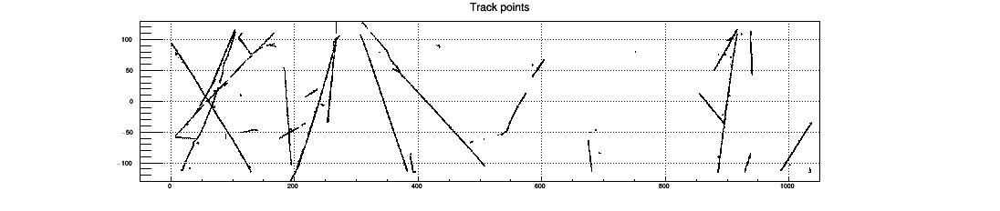

In [14]:
title = 'Track points'
xbin = 1100
xstart = -50
xend = 1050
ybin = 260
ystart = -130
yend = 130
event_nr = 7
data_set = overlay_out
cut = 'fidVol && TrackLength>8 && crt_tom_cut && muon'
cut = '1'
c1.cd()
h_2d = ROOT.TH2F("h_2d", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_trkstart = ROOT.TH2F("h_2d_trkstart", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_trkend = ROOT.TH2F("h_2d_trkend", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Vtx = ROOT.TH2F("h_2d_Vtx", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Pnt = ROOT.TH2F("h_2d_Pnt", title, xbin,xstart,xend,ybin,ystart,yend)
data_set.Draw('AllTrack_point_y:AllTrack_point_z>>h_2d',cut,'',1,event_nr)
h_2d.SetXTitle("Track length [cm]")
h_2d.SetYTitle("True - Range Momentum")
data_set.Draw('TrackStart_y:TrackStart_z>>h_2d_trkstart',cut,'',1,event_nr)
data_set.Draw('TrackEnd_y:TrackEnd_z>>h_2d_trkend',cut,'',1,event_nr)
data_set.Draw('Nu_Vy:Nu_Vz>>h_2d_Vtx',cut,'',1,event_nr)
data_set.Draw('SpacePoint_y:SpacePoint_z>>h_2d_Pnt',cut,'',1,event_nr)
h_2d_trkstart.SetMarkerStyle(5)
h_2d_trkstart.SetMarkerColor(2)
h_2d_trkstart.SetMarkerSize(2.0)
h_2d_trkend.SetMarkerStyle(5)
h_2d_trkend.SetMarkerColor(1)
h_2d_trkend.SetMarkerSize(2.0)
h_2d_Vtx.SetMarkerStyle(4)
h_2d_Vtx.SetMarkerColor(4)
h_2d_Vtx.SetMarkerSize(4.0)
h_2d_Pnt.Draw('')
h_2d.Draw('same colz')
h_2d_trkstart.Draw('same')
h_2d_trkend.Draw('same')
h_2d_Vtx.Draw('same')

#h_2d.Draw('colz')
c1.SetLogy(0)
c1.Draw()
#c1.SaveAs(outputdir_png + "h_range_contained_tracklength.png")
#c1.SaveAs(outputdir_root + "h_range_contained_tracklength.root")

In [78]:
title = 'Track points'
xbin = 1100
xstart = -50
xend = 1050
ybin = 260
ystart = -130
yend = 130
event_nr = 7
data_set = overlay_out
cut = 'fidVol && TrackLength>8 && crt_tom_cut && muon'
cut = '1'
h_2d = ROOT.TH2F("h_2d", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_trkstart = ROOT.TH2F("h_2d_trkstart", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_trkend = ROOT.TH2F("h_2d_trkend", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Vtx = ROOT.TH2F("h_2d_Vtx", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Pnt = ROOT.TH2F("h_2d_Pnt", title, xbin,xstart,xend,ybin,ystart,yend)
data_set.Draw('AllTrack_point_y:AllTrack_point_z>>h_2d',cut,'',1,event_nr)
h_2d.SetXTitle("Beam direction, Z position [cm]")
h_2d.SetYTitle("Horizontal direction, Y position [cm]")
#c2.SetLogy(0)
c1.cd()
data_set.Draw('TrackStart_y:TrackStart_z>>h_2d_trkstart',cut,'',1,event_nr)
data_set.Draw('TrackEnd_y:TrackEnd_z>>h_2d_trkend',cut,'',1,event_nr)
data_set.Draw('Nu_Vy:Nu_Vz>>h_2d_Vtx',cut,'',1,event_nr)
data_set.Draw('SpacePoint_y:SpacePoint_z>>h_2d_Pnt',cut,'',1,event_nr)
h_2d_trkstart.SetMarkerStyle(5)
h_2d_trkstart.SetMarkerColor(2)
h_2d_trkstart.SetMarkerSize(2.0)
h_2d_trkend.SetMarkerStyle(5)
h_2d_trkend.SetMarkerColor(1)
h_2d_trkend.SetMarkerSize(2.0)
h_2d_Vtx.SetMarkerStyle(4)
h_2d_Vtx.SetMarkerColor(4)
h_2d_Vtx.SetMarkerSize(4.0)
#h_2d_Pnt.Draw('')
h_2d.Draw('colz')
data_set.Draw('SpacePoint_y:SpacePoint_z',cut,'same',1,event_nr)
h_2d_trkstart.Draw('same')
h_2d_trkend.Draw('same')
h_2d_Vtx.Draw('same')

c2.cd()
ybin = 280
ystart = -10
yend = 270
h_2dx = ROOT.TH2F("h_2dx", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_trkstartx = ROOT.TH2F("h_2d_trkstartx", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_trkendx = ROOT.TH2F("h_2d_trkendx", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Vtxx = ROOT.TH2F("h_2d_Vtxx", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Pntx = ROOT.TH2F("h_2d_Pntx", title, xbin,xstart,xend,ybin,ystart,yend)
h_2dx.SetXTitle("Beam direction, Z position [cm]")
h_2dx.SetYTitle("Drift direction, X position [cm]")
data_set.Draw('TrackStart_x:TrackStart_z>>h_2d_trkstartx',cut,'',1,event_nr)
data_set.Draw('TrackEnd_x:TrackEnd_z>>h_2d_trkendx',cut,'',1,event_nr)
data_set.Draw('Nu_Vx:Nu_Vz>>h_2d_Vtxx',cut,'',1,event_nr)
data_set.Draw('SpacePoint_x:SpacePoint_z>>h_2d_Pntx',cut,'',1,event_nr)
h_2d_trkstartx.SetMarkerStyle(5)
h_2d_trkstartx.SetMarkerColor(2)
h_2d_trkstartx.SetMarkerSize(2.0)
h_2d_trkendx.SetMarkerStyle(5)
h_2d_trkendx.SetMarkerColor(1)
h_2d_trkendx.SetMarkerSize(2.0)
h_2d_Vtxx.SetMarkerStyle(4)
h_2d_Vtxx.SetMarkerColor(4)
h_2d_Vtxx.SetMarkerSize(4.0)
#h_2d_Pntx.Draw('')
h_2dx.Draw('colz')
data_set.Draw('SpacePoint_x:SpacePoint_z',cut,'same',1,event_nr)
h_2d_trkstartx.Draw('same')
h_2d_trkendx.Draw('same')
h_2d_Vtxx.Draw('same')

c1.Draw()
c2.Draw()

#c1.SaveAs(outputdir_png + "h_range_contained_tracklength.png")
#c1.SaveAs(outputdir_root + "h_range_contained_tracklength.root")

Warning in <TROOT::Append>: Replacing existing TH1: h_2d (Potential memory leak).
Warning in <TROOT::Append>: Replacing existing TH1: h_2d_trkstart (Potential memory leak).
Warning in <TROOT::Append>: Replacing existing TH1: h_2d_trkend (Potential memory leak).
Warning in <TROOT::Append>: Replacing existing TH1: h_2d_Vtx (Potential memory leak).
Warning in <TROOT::Append>: Replacing existing TH1: h_2d_Pnt (Potential memory leak).
Warning in <TROOT::Append>: Replacing existing TH1: h_2dx (Potential memory leak).
Warning in <TROOT::Append>: Replacing existing TH1: h_2d_trkstartx (Potential memory leak).
Warning in <TROOT::Append>: Replacing existing TH1: h_2d_trkendx (Potential memory leak).
Warning in <TROOT::Append>: Replacing existing TH1: h_2d_Vtxx (Potential memory leak).
Warning in <TROOT::Append>: Replacing existing TH1: h_2d_Pntx (Potential memory leak).


In [13]:
xbin = 110
xstart = -50
xend = 105
ybin = 260
ystart = -130
yend = 130
title = 'Track points'
h_2d = ROOT.TH2F("h_2d", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_trkstart = ROOT.TH2F("h_2d_trkstart", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_trkend = ROOT.TH2F("h_2d_trkend", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Vtx = ROOT.TH2F("h_2d_Vtx", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Vtx_MC = ROOT.TH2F("h_2d_Vtx_MC", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Pnt = ROOT.TH2F("h_2d_Pnt", 'Event Display Y - Z plane', xbin,xstart,xend,ybin,ystart,yend)
ybin = 280
ystart = -10
yend = 270
h_2dx = ROOT.TH2F("h_2dx", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_trkstartx = ROOT.TH2F("h_2d_trkstartx", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_trkendx = ROOT.TH2F("h_2d_trkendx", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Vtxx = ROOT.TH2F("h_2d_Vtxx", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Vtx_MCx = ROOT.TH2F("h_2d_Vtx_MCx", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Pntx = ROOT.TH2F("h_2d_Pntx", 'Event Display X - Z plane', xbin,xstart,xend,ybin,ystart,yend)

def event_display(data_set,event_nr,cut):
    is_mc = 0
    if data_set == overlay or data_set == overlay_out:
        is_mc = 1
    c1.cd()
    has_tracks = 0
    has_tracks = data_set.Draw('AllTrack_point_y:AllTrack_point_z>>h_2d',cut,'',1,event_nr)
    max_entry = data_set.GetEntries()-1;
    while has_tracks==0:
        event_nr+=1
        if event_nr > max_entry:
            break
        data_set.Draw('AllTrack_point_y:AllTrack_point_z>>h_2d',cut,'',1,event_nr)
        has_tracks = h_2d.GetEntries()
    #print ext.Draw('AllTrack_point_y:AllTrack_point_z>>h_2d','fidVol','',1,event_nr),' ', has_tracks
    h_2d.SetXTitle("Beam direction, Z position [cm]")
    h_2d.SetYTitle("Horizontal direction, Y position [cm]")
    data_set.Draw('TrackStart_y:TrackStart_z>>h_2d_trkstart',cut,'',1,event_nr)
    data_set.Draw('TrackEnd_y:TrackEnd_z>>h_2d_trkend',cut,'',1,event_nr)
    data_set.Draw('Nu_Vy:Nu_Vz>>h_2d_Vtx',cut,'',1,event_nr)
    #data_set.Draw('SpacePoint_y:SpacePoint_z>>h_2d_Pnt',cut,'',1,event_nr)
    if is_mc == 1:
        data_set.Draw('MCNu_Vy:MCNu_Vz>>h_2d_Vtx_MC',cut,'',1,event_nr)
    h_2d_trkstart.SetMarkerStyle(5)
    h_2d_trkstart.SetMarkerColor(2)
    h_2d_trkstart.SetMarkerSize(2.0)
    h_2d_trkend.SetMarkerStyle(5)
    h_2d_trkend.SetMarkerColor(1)
    h_2d_trkend.SetMarkerSize(2.0)
    h_2d_Vtx.SetMarkerStyle(4)
    h_2d_Vtx.SetMarkerColor(4)
    h_2d_Vtx.SetMarkerSize(4.0)
    h_2d_Vtx_MC.SetMarkerStyle(4)
    h_2d_Vtx_MC.SetMarkerColor(5)
    h_2d_Vtx_MC.SetMarkerSize(4.0)
    #h_2d_Pnt.Draw('')
    h_2d.Draw('colz')
    data_set.Draw('SpacePoint_y:SpacePoint_z',cut,'same *',1,event_nr)
    h_2d_trkstart.Draw('same')
    h_2d_trkend.Draw('same')
    h_2d_Vtx.Draw('same')
    if is_mc == 1:
        h_2d_Vtx_MC.Draw('same')
        
    c2.cd()
    data_set.Draw('AllTrack_point_x:AllTrack_point_z>>h_2dx',cut,'',1,event_nr)
    h_2dx.SetXTitle("Beam direction, Z position [cm]")
    h_2dx.SetYTitle("Drift direction, X position [cm]")
    data_set.Draw('TrackStart_x:TrackStart_z>>h_2d_trkstartx',cut,'',1,event_nr)
    data_set.Draw('TrackEnd_x:TrackEnd_z>>h_2d_trkendx',cut,'',1,event_nr)
    data_set.Draw('Nu_Vx:Nu_Vz>>h_2d_Vtxx',cut,'',1,event_nr)
    #data_set.Draw('SpacePoint_x:SpacePoint_z>>h_2d_Pntx',cut,'',1,event_nr)
    if is_mc == 1:
        data_set.Draw('MCNu_Vx:MCNu_Vz>>h_2d_Vtx_MCx',cut,'',1,event_nr)
    h_2d_trkstartx.SetMarkerStyle(5)
    h_2d_trkstartx.SetMarkerColor(2)
    h_2d_trkstartx.SetMarkerSize(2.0)
    h_2d_trkendx.SetMarkerStyle(5)
    h_2d_trkendx.SetMarkerColor(1)
    h_2d_trkendx.SetMarkerSize(2.0)
    h_2d_Vtxx.SetMarkerStyle(4)
    h_2d_Vtxx.SetMarkerColor(4)
    h_2d_Vtxx.SetMarkerSize(4.0)
    h_2d_Vtx_MCx.SetMarkerStyle(4)
    h_2d_Vtx_MCx.SetMarkerColor(5)
    h_2d_Vtx_MCx.SetMarkerSize(4.0)
    #h_2d_Pntx.Draw('')
    h_2dx.Draw('colz')
    data_set.Draw('SpacePoint_x:SpacePoint_z',cut,'same *',1,event_nr)
    h_2d_trkstartx.Draw('same')
    h_2d_trkendx.Draw('same')
    h_2d_Vtxx.Draw('same')
    if is_mc == 1:
        h_2d_Vtx_MCx.Draw('same')
    #print 'in function:', h_2d.GetEntries()
    
    c1.Draw()
    c2.Draw()
    this_entry = data_set.GetEntry(event_nr)
    print "Showing event nr:", event_nr
    for i,element in enumerate(cols):
        if i % 3 ==0:
            print '%20s:\t'%element,'{0:0.2f}'.format(tree_Event[element][event_nr]),
        elif i%3==1:
            print '%20s:\t'%element,'{0:0.2f}'.format(tree_Event[element][event_nr]),
        else:
            print '%20s:\t'%element,'{0:0.2f}'.format(tree_Event[element][event_nr])
    #print "Number of Tracks: ", this_entry.Print()
    return event_nr
    #c1.SaveAs(outputdir_png + "h_range_contained_tracklength.png")
    #c1.SaveAs(outputdir_root + "h_range_contained_tracklength.root")/2

In [14]:
event_nr = 0
event_nr = event_display(overlay_out,event_nr,'1')
#print h_2d.GetEntries()
c1.Draw()
c2.Draw()

Showing event nr: 1
             NuScore:	0.05           FlashScore:	3.71               NumPfp:	1.00
            NuTracks:	1.00      NumShowers_corr:	0.00           TrackScore:	0.85
         TrackLength:	49.52      VtxDistance_sce:	0.08     TrackMomRange_mu:	0.22
     TrackMomMCS_mom:	0.23     TrackPID_chimuon:	57.20   TrackPID_chiproton:	9.28
    TrackPID_chipion:	55.09          ShowerScore:	0.00             flash_PE:	2767.89
      nr_crthit_beam:	1.00            MCNu_CCNC:	0.00             MCNu_PDG:	14.00
         MCNu_Energy:	1.24    MCNu_LeptonEnergy:	0.74             MCle_PDG:	2112.00
         MCle_purity:	0.99          MCle_Energy:	1.37          MCle_length:	0.00
          small_wire:	0.00           wire_plane:	100.00


In [15]:
def next(ext,event_nr,cut):
    event_nr+=1
    event_nr = event_display(ext,event_nr,cut)
    return event_nr

In [16]:
event_nr = 0
cut = 'Nu_Vz_sce<10 && NuPDG==14'

# 'wire_plane%10!=1 && wire_plane!=0

In [27]:
event_nr = next(overlay_out,event_nr,cut)
#c1.Update()


Showing event nr: 435
             NuScore:	0.15           FlashScore:	20.96               NumPfp:	1.00
            NuTracks:	1.00      NumShowers_corr:	0.00           TrackScore:	0.66
         TrackLength:	10.27      VtxDistance_sce:	0.32     TrackMomRange_mu:	0.11
     TrackMomMCS_mom:	0.09     TrackPID_chimuon:	12.37   TrackPID_chiproton:	120.99
    TrackPID_chipion:	15.83          ShowerScore:	0.00             flash_PE:	1554.50
      nr_crthit_beam:	0.00            MCNu_CCNC:	1.00             MCNu_PDG:	14.00
         MCNu_Energy:	1.70    MCNu_LeptonEnergy:	0.83             MCle_PDG:	2212.00
         MCle_purity:	0.98          MCle_Energy:	1.50          MCle_length:	0.00
          small_wire:	24.00           wire_plane:	0.00


In [84]:
# General Evetns:

# ev 61 is one track 0 shower, 101,193,211,292,299
# ev 70: wrongly matched pion with decays, 566, 611, 614
# ev 77: NC event with backward proton (will be cut with PID), 122, 198 fowrard proton
# ev 107: CC 1 track 1 shower, with one overlaping track
# ev 128: brocken track, vertex wrongly in the middle, 293
# ev 154: NC event with matched pion, 616 NC with proton
# ev 160: Correct identified event, vertex at wrong place
# ev 168: Correct identified numuCC strange MC vertex
# ev 205: Wrongly matched numuCC with cosmic
# ev 222: >1m backward going muon (360 MeV), nothing else, correctly matched, 250 CCnumu 2tracks, 294
# ev 227: numuCC with matched proton (w/o PID cut) with 1.67m long track, 343, 573
# ev 242: Nice 3 track numuCC event, 253: 4.24GeV 3track, 5 shower event, 339
# ev 274: NumuCC matched with photon, very strange points
# ev 578: NumuCC with matched pion and no muon?
# ev 595: very strange NC event

# Events with Vertex - Track distance > 20:
# ev 41: broken track
# ev 160: correct muon matching, reco vertex way off
# ev 508: wrong matched proton track
# ev 692: very strange distant correct muon track, 770, 830, 989
# ev 753: NC event
# +1000 ev: (to 3333)
# ev 56: NC, 1168,1413,3206
# ev 243: Muon bad matched
# ev 331: cosmic matched, 388,603,627,846,903,926,1101,1731,2017,2261,2307,3023,3333
# ev 732: reco vertex completely out,952,1124,1821,2687,2752,3092
# ev 1046: broken/cosmic matched,1873,2897  broken:2033,2034,2282,2488,2611
# ev 2248: Muon wrong matched
# ev 2503: Nue
# ev 2683: OutFidVol

In [85]:
title = 'Track points'
xbin = 1100
xstart = -50
xend = 1050
ybin = 260
ystart = -130
yend = 130
event_nr = 7
data_set = overlay
cut = 'fidVol && TrackLength>8 && crt_tom_cut && muon'
cut = '1'
h_2d_Pnt = ROOT.TH2F("h_2d_Pnt", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Pnt.SetXTitle("Track length [cm]")
h_2d_Pnt.SetYTitle("True - Range Momentum")
data_set.Draw('AllTrack_point_y:AllTrack_point_z>>h_2d_Pnt',cut,'')
h_2d_Pnt.Draw('colz')
c1.SetLogy(0)
c1.Draw()
print 'Events in the file:', data_set.GetEntries(),' with number of Piont:', h_2d_Pnt.GetEntries()
#c1.SaveAs(outputdir_png + "h_range_contained_tracklength.png")
#c1.SaveAs(outputdir_root + "h_range_contained_tracklength.root")

Events in the file: 10000  with number of Piont: 3592297.0


Warning in <TROOT::Append>: Replacing existing TH1: h_2d_Pnt (Potential memory leak).


In [86]:
title = 'Track points'
xbin = 1100
xstart = -50
xend = 1050
ybin = 260
ystart = -130
yend = 130
event_nr = 7
data_set = ext
cut = 'fidVol && TrackLength>8 && crt_tom_cut && muon'
cut = '1'
h_2d_Pnt = ROOT.TH2F("h_2d_Pnt", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Pnt.SetXTitle("Track length [cm]")
h_2d_Pnt.SetYTitle("True - Range Momentum")
data_set.Draw('AllTrack_point_y:AllTrack_point_z>>h_2d_Pnt',cut,'')
h_2d_Pnt.Draw('colz')
c1.SetLogy(0)
c1.Draw()
print 'Events in the file:', data_set.GetEntries(),' with number of Piont:', h_2d_Pnt.GetEntries()

#c1.SaveAs(outputdir_png + "h_range_contained_tracklength.png")
#c1.SaveAs(outputdir_root + "h_range_contained_tracklength.root")

Events in the file: 10000  with number of Piont: 1068659.0


Warning in <TROOT::Append>: Replacing existing TH1: h_2d_Pnt (Potential memory leak).


In [87]:
title = 'Track points'
xbin = 110
xstart = -50
xend = 1050
ybin = 26
ystart = -130
yend = 130
event_nr = 7
data_set = overlay
cut = 'fidVol && TrackLength>8 && crt_tom_cut && muon'
cut = '1'
h_2d_Pnt = ROOT.TH2F("h_2d_Pnt", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Pnt.SetXTitle("Track length [cm]")
h_2d_Pnt.SetYTitle("True - Range Momentum")
data_set.Draw('Nu_Vy_sce:Nu_Vz_sce>>h_2d_Pnt',cut,'')
h_2d_Pnt.Draw('colz')
c1.SetLogy(0)
c1.Draw()
print 'Events in the file:', data_set.GetEntries(),' with number of Piont:', h_2d_Pnt.GetEntries()
#c1.SaveAs(outputdir_png + "h_range_contained_tracklength.png")
#c1.SaveAs(outputdir_root + "h_range_contained_tracklength.root")


Events in the file: 10000  with number of Piont: 10000.0


Warning in <TROOT::Append>: Replacing existing TH1: h_2d_Pnt (Potential memory leak).


Events in the file: 10000  with number of Piont: 10000.0


Warning in <TROOT::Append>: Replacing existing TH1: h_2d_Pnt (Potential memory leak).


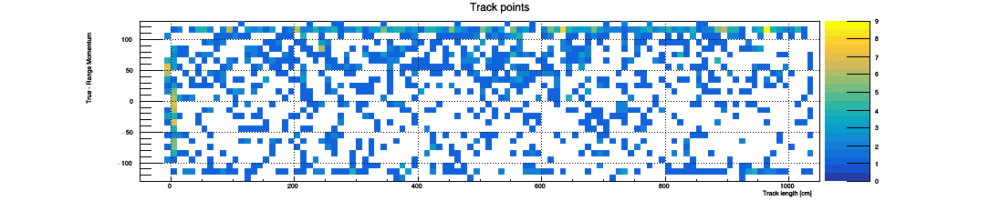

In [19]:
title = 'Track points'
xbin = 110
xstart = -50
xend = 1050
ybin = 26
ystart = -130
yend = 130
event_nr = 7
data_set = ext
cut = 'fidVol && TrackLength>8 && crt_tom_cut && muon && wire_plane==100'
cut = '1'
h_2d_Pnt = ROOT.TH2F("h_2d_Pnt", title, xbin,xstart,xend,ybin,ystart,yend)
h_2d_Pnt.SetXTitle("Track length [cm]")
h_2d_Pnt.SetYTitle("True - Range Momentum")
data_set.Draw('Nu_Vy_sce:Nu_Vz_sce>>h_2d_Pnt',cut,'')
h_2d_Pnt.Draw('colz')
c1.SetLogy(0)
c1.Draw()
print 'Events in the file:', data_set.GetEntries(),' with number of Piont:', h_2d_Pnt.GetEntries()
#c1.SaveAs(outputdir_png + "h_range_contained_tracklength.png")
#c1.SaveAs(outputdir_root + "h_range_contained_tracklength.root")


In [106]:
ROOT.gStyle.SetOptStat(0)
c3 = ROOT.TCanvas("c3","c3",800,600)
c3.SetGrid(1)
c3.SetLeftMargin(0.14)
c3.SetRightMargin(0.18)
c3.SetBottomMargin(0.14)

In [100]:
cut = 'fidVol && TrackLength>8 && crt_tom_cut && muon'
NuCC.printEffonly_out(cut, 'overlay_out')

Rejection on each sample:
Keep of overlay_out:	78.09%	 reject:	21.91%
Efficiency:		56.98%
Signal definition=  numu_lowpur	(2.87%)
Signal definition=   numu_other	(0.87%)
Signal definition=    numu_nomu	(7.73%)
Signal definition=      numu_ov	(12.47%)
Signal definition=  numu_signal	(63.09%)
Signal definition=      numu_nc	(12.97%)


In [101]:
cut = 'fidVol && TrackLength>8 && crt_tom_cut && muon'
NuCC.printEffonly_out(cut, 'ext_out')

Rejection on each sample:
Keep of ext_out:	32.86%	 reject:	67.14%


In [102]:
cut = 'fidVol && TrackLength>8 && crt_tom_cut && muon'
NuCC.printEffonly_out(cut, 'dirt_out')

Rejection on each sample:
Keep of dirt_out:	41.94%	 reject:	58.06%


In [108]:
cut = 'fidVol && TrackLength>8 && crt_tom_cut && muon && (wire_plane>0)'
NuCC.printEffonly_out(cut, "overlay_out")

Rejection on each sample:
Keep of overlay_out:	60.76%	 reject:	39.24%
Efficiency:		44.71%
Signal definition=  numu_lowpur	(2.72%)
Signal definition=   numu_other	(0.48%)
Signal definition=    numu_nomu	(8.01%)
Signal definition=      numu_ov	(13.14%)
Signal definition=  numu_signal	(63.62%)
Signal definition=      numu_nc	(12.02%)


In [109]:
cut = 'fidVol && TrackLength>8 && crt_tom_cut && muon && (wire_plane>0)'
NuCC.printEffonly_out(cut, "ext_out")

Rejection on each sample:
Keep of ext_out:	27.14%	 reject:	72.86%


In [110]:
cut = 'fidVol && TrackLength>8 && crt_tom_cut && muon && (wire_plane>0)'
NuCC.printEffonly_out(cut, "dirt_out")

Rejection on each sample:
Keep of dirt_out:	35.48%	 reject:	64.52%


Warning in <TROOT::Append>: Replacing existing TH1: h_wire (Potential memory leak).
Info in <TCanvas::Print>: png file /home/tmettler/Desktop/ub_data/mcc9.1/v08_00_00_17_V2/NumuCC_tpc_cut//png/h_wire_wireid.png has been created
Info in <TCanvas::SaveAs>: ROOT file /home/tmettler/Desktop/ub_data/mcc9.1/v08_00_00_17_V2/NumuCC_tpc_cut//root/h_wire_wireid.root has been created


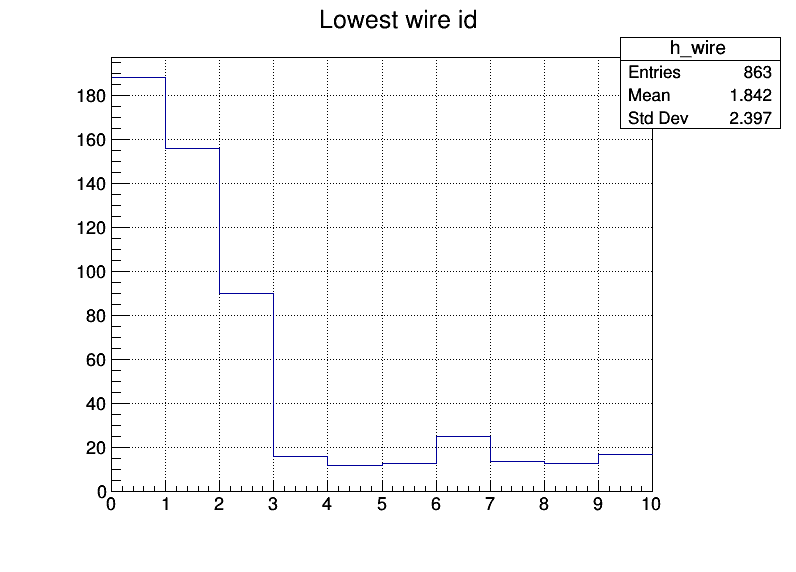

In [111]:
title = 'Lowest wire id'
name = 'wireid'
xstart = 0
xend = 10
xbin = 10
ROOT.gStyle.SetOptStat(1)
cut = 'fidVol && muon && crt_tom_cut &&'
h_wire = ROOT.TH1F("h_wire",title,xbin,xstart,xend)
overlay_out.Draw('wire_plane>>h_wire',cut+'1')
h_wire.Draw('')
h_wire.SetMinimum(0)
c3.SetLogy(0)
c3.Draw()
c3.SaveAs(outputdir_png + "h_wire_"+name+".png")
c3.SaveAs(outputdir_root + "h_wire_"+name+".root")

Warning in <TROOT::Append>: Replacing existing TH1: h_wire (Potential memory leak).
Info in <TCanvas::Print>: png file /home/tmettler/Desktop/ub_data/mcc9.1/v08_00_00_17_V2/NumuCC_tpc_cut//png/h_wire_wirehits.png has been created
Info in <TCanvas::SaveAs>: ROOT file /home/tmettler/Desktop/ub_data/mcc9.1/v08_00_00_17_V2/NumuCC_tpc_cut//root/h_wire_wirehits.root has been created


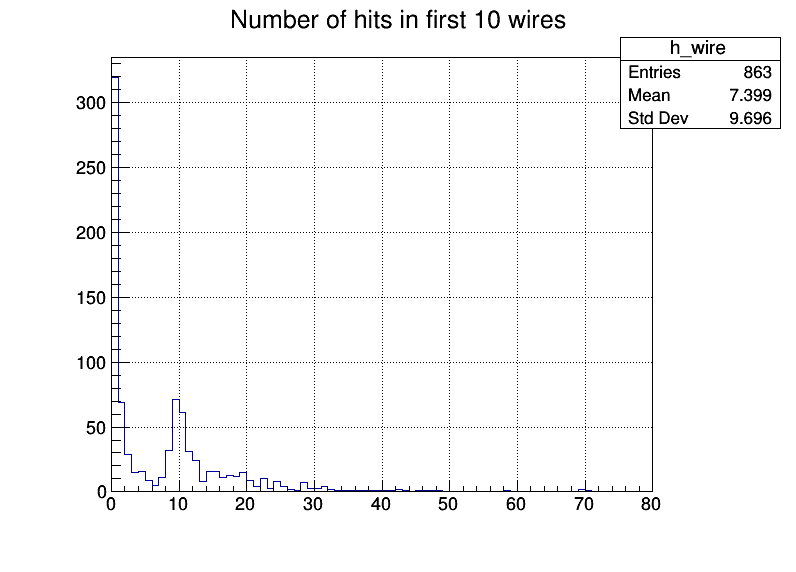

In [36]:
title = 'Number of hits in first 10 wires'
name = 'wirehits'
xstart = 0
xend = 80
xbin = 80
cut = 'fidVol && muon && crt_tom_cut &&'
h_wire = ROOT.TH1F("h_wire",title,xbin,xstart,xend)
overlay_out.Draw('small_wire>>h_wire',cut+'1')
h_wire.Draw('')
h_wire.SetMinimum(0)
c3.SetLogy(0)
c3.Draw()
c3.SaveAs(outputdir_png + "h_wire_"+name+".png")
c3.SaveAs(outputdir_root + "h_wire_"+name+".root")